# GradCAM

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import sys
sys.path.append('/content/drive/My Drive/CS7643_GroupProject')

In [3]:
import pandas as pd
import numpy as np
import csv
import random
from PIL import Image
from collections import defaultdict
import seaborn as sns
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models
import torch.optim as optim
from tqdm.notebook import tqdm
from sklearn.metrics import confusion_matrix
import matplotlib
import matplotlib.pyplot as plt
import cv2
%matplotlib inline

# Preprocessing Data

In [4]:
df = pd.read_csv('/content/drive/My Drive/CS7643_GroupProject/data/fer2013.csv')

In [5]:
df.shape

(35887, 3)

In [6]:
emotion_labels = {0:'Angry', 1:'Disgust', 2:'Fear', 3:'Happy', 4:'Sad', 5:'Surprise', 6:'Neutral'}
emotion_counts = df['emotion'].value_counts(sort=True).reset_index()
emotion_counts.columns = ['emotion', 'number']
emotion_counts['emotion'] = emotion_counts['emotion'].map(emotion_labels)
emotion_counts

,emotion,number
0,Happy,8989
1,Neutral,6198
2,Sad,6077
3,Fear,5121
4,Angry,4953
5,Surprise,4002
6,Disgust,547


In [7]:
train_df = df[df['Usage']=='Training']
val_df   = df[df['Usage']=='PublicTest']
test_df  = df[df['Usage']=='PrivateTest']
print("train shape: {}, \nvalidation shape: {}, \ntest shape: {}".format(train_df.shape, val_df.shape, test_df.shape))

train shape: (28709, 3), 
validation shape: (3589, 3), 
test shape: (3589, 3)


# Create Custom FER2013 Dataset Class

In [9]:
class FER2013Dataset(Dataset):
    def __init__(self, data, transform=None):
        """
        Args:
            data (DataFrame): The dataset loaded using pandas DataFrame.
            transform (callable, optional): Optional transformations to apply to the images.
        """
        self.data = data
        self.transform = transform
        self.labels = data['emotion'].values
        self.pixels = data['pixels'].values

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        # Convert the pixel string to a numpy array and reshape to 48x48
        image = np.array(self.pixels[idx].split(), dtype=np.float32).reshape(48, 48)
        label = int(self.labels[idx])

        # Convert grayscale to RGB
        image = np.stack([image] * 3, axis=-1).astype(np.uint8)
        image = Image.fromarray(image)

        # Apply transformations if provided
        if self.transform:
            image = self.transform(image)

        # Convert image and label to tensors
        image = torch.tensor(image, dtype=torch.float32)
        label = torch.tensor(label, dtype=torch.long)

        return image, label

# Define Transformation and Initialize Datasets

In [10]:
# Train Transformation with Data augmentation of horizontal mirroring, ±10 degree rotations, ±10% image zooms, and ±10% horizontal/vertical shifting,
# Pixel values normalized to [-1, 1]
train_transform_with_augmentation = transforms.Compose([
    transforms.Resize((224, 224)), # Resize for the model
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(degrees=10),
    transforms.RandomAffine(
        degrees=0,
        translate=(0.1, 0.1), # ±10% horizontal and vertical shifting
        scale=(0.9, 1.1) # ±10% zoom (scale between 90% and 110%)
    ),
    transforms.ToTensor(),
    transforms.Normalize([0.5], [0.5]) # Normalize pixels to mean=0.5 and std=0.5
])

test_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.5],[0.5])
])

train_dataset_with_augmentation = FER2013Dataset(train_df, train_transform_with_augmentation)
val_dataset = FER2013Dataset(val_df, test_transform)
test_dataset = FER2013Dataset(test_df, test_transform)

# Create Dataloader

In [11]:
BATCH_SIZE = 64

train_augmented_dataloader = DataLoader(train_dataset_with_augmentation, BATCH_SIZE, shuffle=True)
val_dataloader = DataLoader(val_dataset, BATCH_SIZE)

In [12]:
test_dataloader = DataLoader(test_dataset, batch_size=1, shuffle=False)

In [13]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


# Train using ImageNet pretrained ResNet18 model

In [14]:
model = models.resnet18(weights=models.ResNet18_Weights.DEFAULT)
model.fc = torch.nn.Linear(model.fc.in_features, 7)
model = model.to(device)
print(model)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 73.7MB/s]


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [15]:
EPOCHS = 20
LEARNING_RATE = 0.001

loss_function = nn.CrossEntropyLoss()
optimizer = optim.AdamW(model.parameters(), weight_decay=5e-2, lr=LEARNING_RATE)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min')

In [16]:
def train(model, dataloader, optimizer, loss_fn):
    model.train()
    train_running_loss = 0.0
    train_running_acc = 0.0

    for images, labels in tqdm(dataloader, desc="Training...", total=len(dataloader)):
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = loss_fn(outputs, labels)

        train_running_loss += loss.clone().detach()
        train_running_acc += accuracy(outputs.clone().detach(), labels)

        loss.backward()
        optimizer.step()

    train_loss = train_running_loss / len(dataloader)
    train_acc = train_running_acc / len(dataloader)

    return train_loss, train_acc

In [17]:
def validate(model, dataloader, optimizer, loss_fn):
    model.eval()

    valid_running_loss = 0.0
    vaild_running_acc = 0.0

    with torch.no_grad():
        for images, labels in tqdm(dataloader, desc="Validating...", total=len(dataloader)):
            images, labels = images.to(device), labels.to(device)

            outputs = model(images)
            loss = loss_fn(outputs, labels)
            valid_running_loss += loss.clone().detach()
            vaild_running_acc += accuracy(outputs.clone().detach(), labels)

    valid_loss = valid_running_loss / len(dataloader)
    valid_acc = vaild_running_acc / len(dataloader)

    return valid_loss, valid_acc


In [18]:
def accuracy(outputs, labels):
    _, preds = torch.max(outputs, dim=1)
    return torch.tensor(torch.sum(preds == labels).item() / len(preds))

In [19]:
train_loss = []
val_loss = []
train_acc = []
val_acc = []

for epoch in range(1, EPOCHS + 1):
    train_epoch_loss, train_epoch_acc = train(model, train_augmented_dataloader, optimizer, loss_function)
    val_epoch_loss, val_epoch_acc = validate(model, val_dataloader, optimizer, loss_function)
    scheduler.step(val_epoch_loss)

    train_loss.append(train_epoch_loss.detach().cpu().numpy())
    val_loss.append(val_epoch_loss.detach().cpu().numpy())
    train_acc.append(train_epoch_acc.detach().cpu().numpy())
    val_acc.append(val_epoch_acc.detach().cpu().numpy())
    print(f'Epoch: {epoch},\
          Train loss: {train_epoch_loss:.4f},\
          Train acc: {train_epoch_acc:.4f},\
          Val loss: {val_epoch_loss:.4f},\
          Val acc: {val_epoch_acc:.4f}\
          ')
print('DONE TRAINING')

Training...:   0%|          | 0/449 [00:00<?, ?it/s]

<ipython-input-9-1cc328b73519>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image = torch.tensor(image, dtype=torch.float32)


Validating...:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch: 1,          Train loss: 1.2715,          Train acc: 0.5145,          Val loss: 1.1661,          Val acc: 0.5561          


Training...:   0%|          | 0/449 [00:00<?, ?it/s]

Validating...:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch: 2,          Train loss: 1.0906,          Train acc: 0.5895,          Val loss: 1.0608,          Val acc: 0.6086          


Training...:   0%|          | 0/449 [00:00<?, ?it/s]

Validating...:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch: 3,          Train loss: 1.0253,          Train acc: 0.6139,          Val loss: 1.0333,          Val acc: 0.6171          


Training...:   0%|          | 0/449 [00:00<?, ?it/s]

Validating...:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch: 4,          Train loss: 0.9869,          Train acc: 0.6287,          Val loss: 1.0663,          Val acc: 0.5961          


Training...:   0%|          | 0/449 [00:00<?, ?it/s]

Validating...:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch: 5,          Train loss: 0.9448,          Train acc: 0.6445,          Val loss: 1.0207,          Val acc: 0.6156          


Training...:   0%|          | 0/449 [00:00<?, ?it/s]

Validating...:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch: 6,          Train loss: 0.9177,          Train acc: 0.6573,          Val loss: 1.0144,          Val acc: 0.6150          


Training...:   0%|          | 0/449 [00:00<?, ?it/s]

Validating...:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch: 7,          Train loss: 0.8901,          Train acc: 0.6641,          Val loss: 0.9879,          Val acc: 0.6314          


Training...:   0%|          | 0/449 [00:00<?, ?it/s]

Validating...:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch: 8,          Train loss: 0.8637,          Train acc: 0.6773,          Val loss: 0.9738,          Val acc: 0.6375          


Training...:   0%|          | 0/449 [00:00<?, ?it/s]

Validating...:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch: 9,          Train loss: 0.8418,          Train acc: 0.6862,          Val loss: 0.9665,          Val acc: 0.6353          


Training...:   0%|          | 0/449 [00:00<?, ?it/s]

Validating...:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch: 10,          Train loss: 0.8236,          Train acc: 0.6911,          Val loss: 0.9317,          Val acc: 0.6536          


Training...:   0%|          | 0/449 [00:00<?, ?it/s]

Validating...:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch: 11,          Train loss: 0.8018,          Train acc: 0.7001,          Val loss: 0.9594,          Val acc: 0.6457          


Training...:   0%|          | 0/449 [00:00<?, ?it/s]

Validating...:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch: 12,          Train loss: 0.7761,          Train acc: 0.7115,          Val loss: 0.9215,          Val acc: 0.6659          


Training...:   0%|          | 0/449 [00:00<?, ?it/s]

Validating...:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch: 13,          Train loss: 0.7520,          Train acc: 0.7214,          Val loss: 0.9469,          Val acc: 0.6432          


Training...:   0%|          | 0/449 [00:00<?, ?it/s]

Validating...:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch: 14,          Train loss: 0.7349,          Train acc: 0.7267,          Val loss: 0.9994,          Val acc: 0.6522          


Training...:   0%|          | 0/449 [00:00<?, ?it/s]

Validating...:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch: 15,          Train loss: 0.7129,          Train acc: 0.7372,          Val loss: 0.9934,          Val acc: 0.6610          


Training...:   0%|          | 0/449 [00:00<?, ?it/s]

Validating...:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch: 16,          Train loss: 0.6910,          Train acc: 0.7425,          Val loss: 0.9671,          Val acc: 0.6676          


Training...:   0%|          | 0/449 [00:00<?, ?it/s]

Validating...:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch: 17,          Train loss: 0.6719,          Train acc: 0.7509,          Val loss: 0.9842,          Val acc: 0.6623          


Training...:   0%|          | 0/449 [00:00<?, ?it/s]

Validating...:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch: 18,          Train loss: 0.6493,          Train acc: 0.7598,          Val loss: 0.9707,          Val acc: 0.6644          


Training...:   0%|          | 0/449 [00:00<?, ?it/s]

Validating...:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch: 19,          Train loss: 0.6250,          Train acc: 0.7704,          Val loss: 0.9635,          Val acc: 0.6723          


Training...:   0%|          | 0/449 [00:00<?, ?it/s]

Validating...:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch: 20,          Train loss: 0.6108,          Train acc: 0.7735,          Val loss: 0.9945,          Val acc: 0.6720          
DONE TRAINING


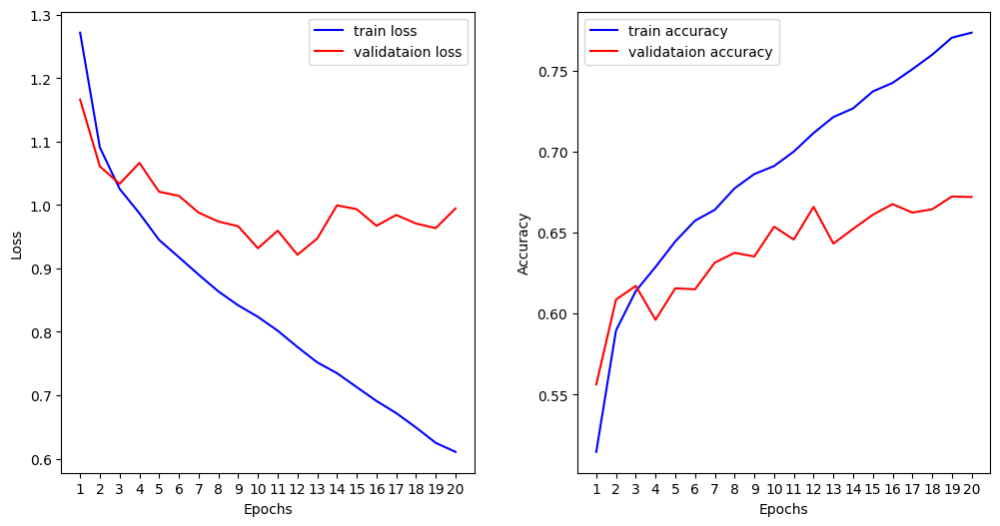

In [22]:
plt.figure(figsize=(12, 6))

# loss plot
plt.subplot(121)
plt.plot(train_loss, color='blue', label='train loss')
plt.plot(val_loss, color='red', label='validataion loss')
plt.xlabel('Epochs')
plt.xticks(range(EPOCHS), range(1, EPOCHS + 1))
plt.ylabel('Loss')
plt.legend()


# accuracy plot
plt.subplot(122)
plt.plot(train_acc, color='blue', label='train accuracy')
plt.plot(val_acc, color='red', label='validataion accuracy')
plt.xlabel('Epochs')
plt.xticks(range(EPOCHS), range(1, EPOCHS + 1))
plt.ylabel('Accuracy')
plt.legend()
plt.subplots_adjust(wspace=0.25)
plt.show()

In [23]:
torch.save(model.state_dict(), "fer2013_resnet18_pretrained.pth")

# Define GradCAM function

In [25]:
def grad_cam(model, image, target_class, target_layer):
    """
    Perform Grad-CAM manually.

    Args:
        model (torch.nn.Module): Trained model.
        image (torch.Tensor): Input image of shape (1, C, H, W).
        target_class (int): Class index for which Grad-CAM is computed.
        target_layer (torch.nn.Module): Target convolutional layer.

    Returns:
        heatmap (np.array): Grad-CAM heatmap.
    """
    # Forward pass
    model.eval()
    features = []
    gradients = []

    # Hook to capture activations and gradients
    def forward_hook(module, input, output):
        features.append(output)

    def backward_hook(module, grad_in, grad_out):
        gradients.append(grad_out[0])

    # Register hooks
    handle_forward = target_layer.register_forward_hook(forward_hook)
    handle_backward = target_layer.register_backward_hook(backward_hook)

    # Forward pass
    output = model(image)
    pred = F.softmax(output, dim=1)

    # Backward pass for the target class
    model.zero_grad()
    pred[0, target_class].backward()

    # Get captured activations and gradients
    activations = features[0].detach()  # Feature maps from forward pass
    gradients = gradients[0].detach()  # Gradients from backward pass

    # Global average pooling of gradients
    weights = torch.mean(gradients, dim=(2, 3), keepdim=True)

    # Weighted sum of feature maps
    cam = torch.sum(weights * activations, dim=1).squeeze()

    # ReLU activation (remove negative values)
    cam = F.relu(cam)

    # Normalize heatmap
    cam -= cam.min()
    cam /= cam.max()

    # Detach hooks
    handle_forward.remove()
    handle_backward.remove()

    return cam.cpu().numpy()

# Define GradCAM heatmap overlay function

In [27]:
def overlay_heatmap(image, heatmap, alpha=0.5, colormap=cv2.COLORMAP_JET):
    """
    Overlay Grad-CAM heatmap on the original image.

    Args:
        image (np.array): Original image in RGB format.
        heatmap (np.array): Grad-CAM heatmap.
        alpha (float): Transparency factor for overlay.
        colormap (int): OpenCV colormap for heatmap.

    Returns:
        overlay (np.array): Image with Grad-CAM overlay.
    """
    heatmap = cv2.resize(heatmap, (image.shape[1], image.shape[0]))  # Resize heatmap to match image size

    heatmap = cv2.applyColorMap(np.uint8(255 * heatmap), colormap)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
    overlay = cv2.addWeighted(image, 1 - alpha, heatmap, alpha, 0)
    return overlay

# Define find_correct_test_labels function and Filter test samples predicted correctly
Test the model and find all correctly predicted test samples for certain label class

# Class Label = Happy

In [28]:
class_index = list(emotion_labels.keys())[list(emotion_labels.values()).index('Happy')]

In [29]:
def find_correct_test_labels(model, dataloader, class_index):
    model.eval()

    correct_class_samples = []

    with torch.no_grad():
        for images, labels in tqdm(dataloader, desc="Testing...", total=len(dataloader)):
            images, labels = images.to(device), labels.to(device)

            outputs = model(images)

            _, predictions = torch.max(outputs, 1)
            predictions = predictions.cpu().detach().numpy()
            labels = labels.cpu().detach().numpy()

            # collect the correct predictions for specific label class
            for label, prediction in zip(labels, predictions):
                if label == prediction and label == class_index:
                    correct_class_samples.append((images, labels))

    return correct_class_samples

correct_class_samples = find_correct_test_labels(model, test_dataloader, class_index)
print(len(correct_class_samples))

Testing...:   0%|          | 0/3589 [00:00<?, ?it/s]

<ipython-input-9-1cc328b73519>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image = torch.tensor(image, dtype=torch.float32)


777


# Generate GradCAM for correct predictions

In [45]:
# Load the trained model weights
model.load_state_dict(torch.load("fer2013_resnet18_pretrained.pth"))

<ipython-input-45-37e89ba8b3d1>:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("fer2013_resnet18_pretrained.pth"))


<All keys matched successfully>

In [50]:
target_layer = model.layer4[1].conv2  # Choose the last convolutional layer
#target_layer = model.layer4[2].conv3

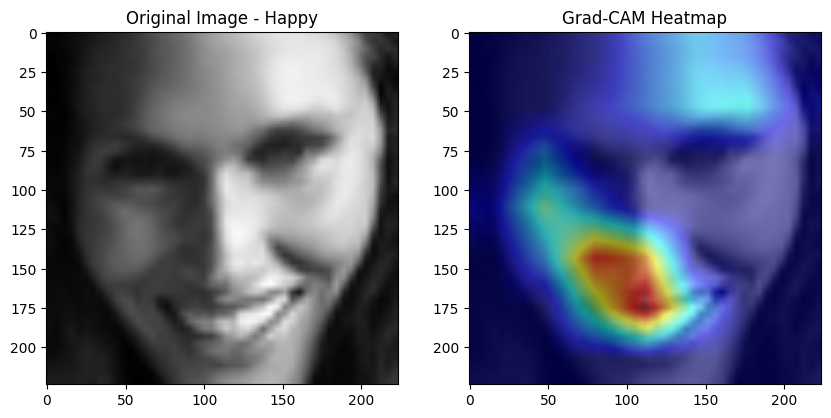

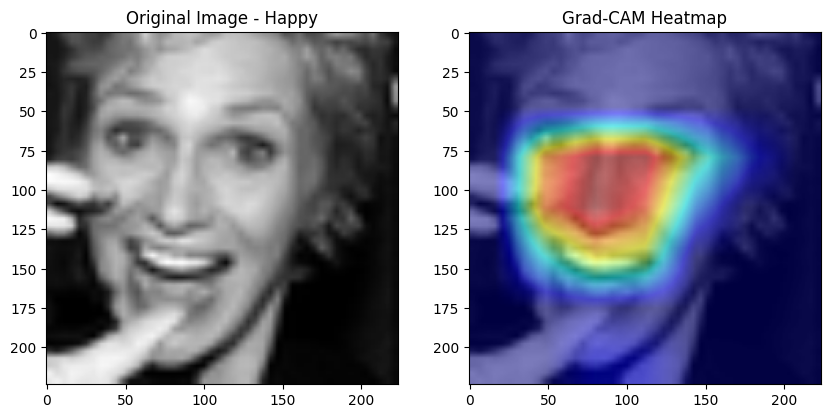

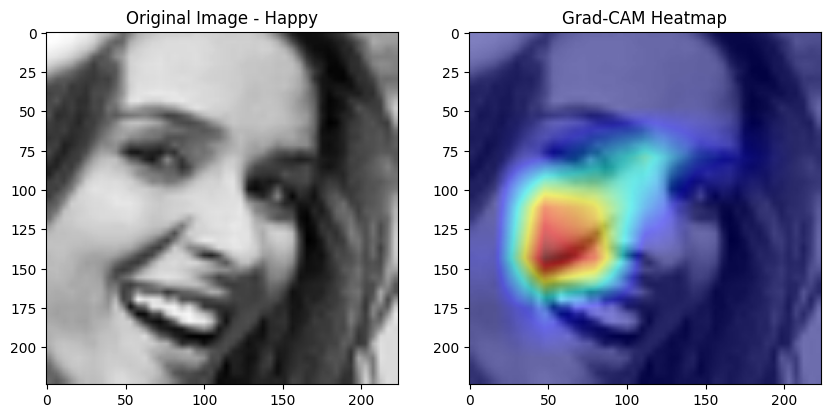

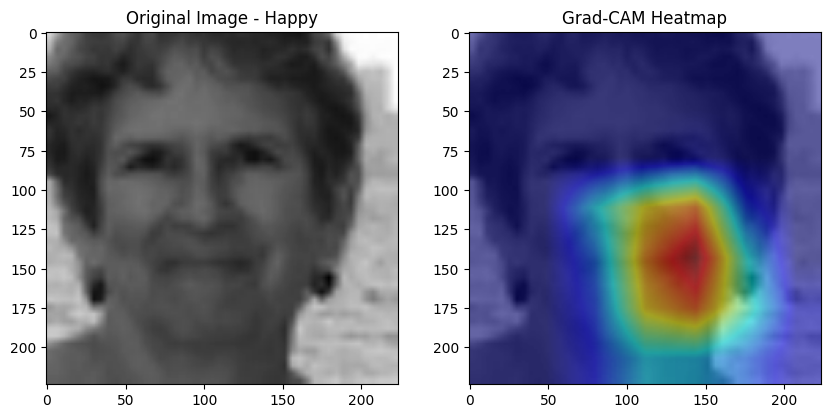

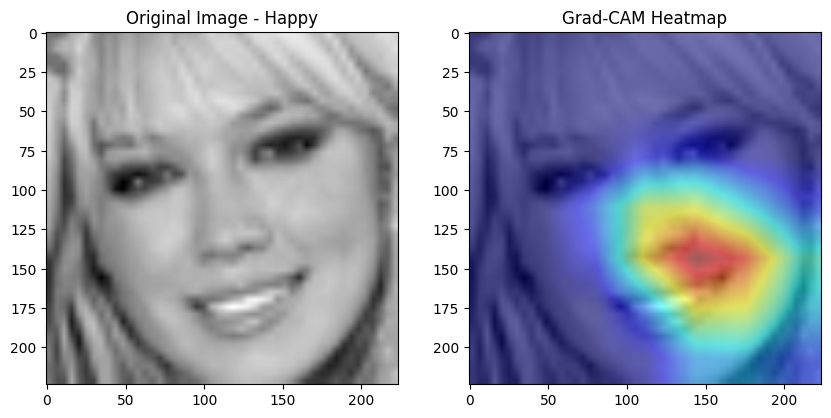

...

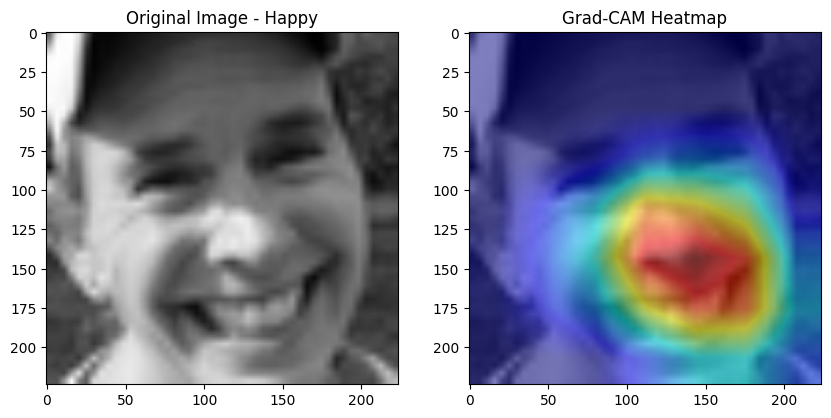

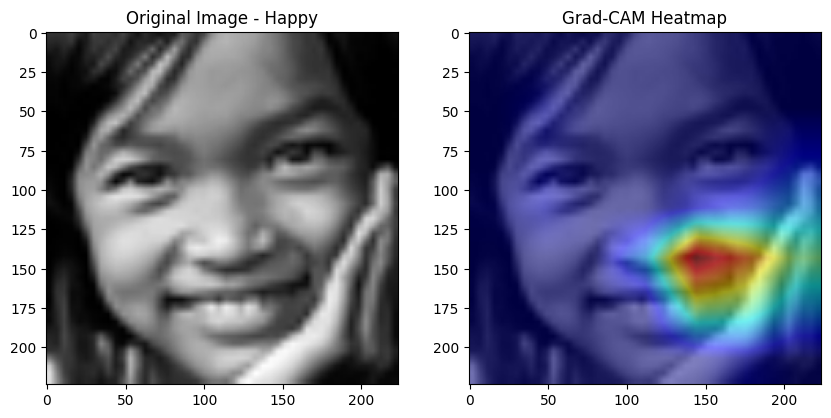

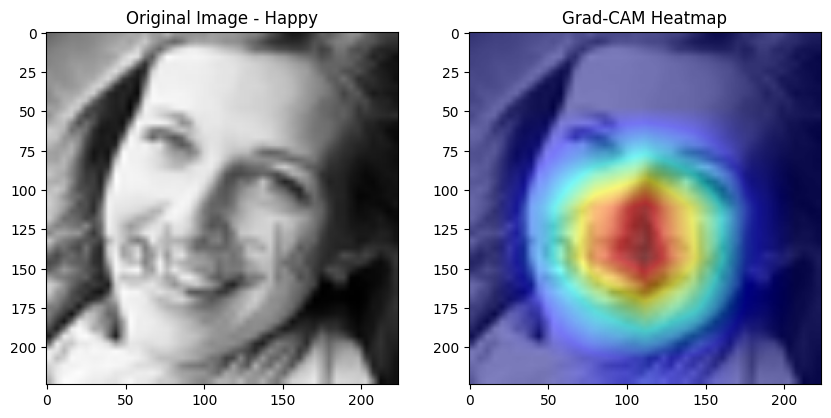

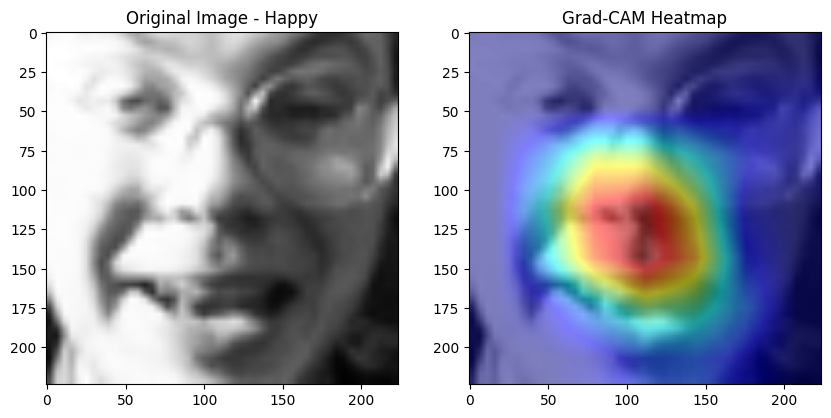

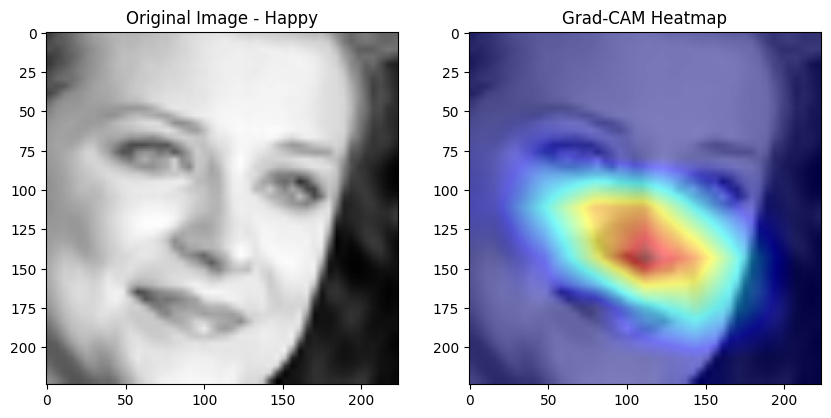

In [54]:
# Apply Grad-CAM to correctly predicted "happy" samples
for idx, (image, label) in enumerate(correct_class_samples):
    cam = grad_cam(model, image, class_index, target_layer)

    # Prepare the image for visualization
    input_image = image.squeeze().permute(1, 2, 0).detach().cpu().numpy()
    input_image = (input_image - input_image.min()) / (input_image.max() - input_image.min())  # Normalize to [0, 1]
    input_image = np.uint8(255 * input_image)

    # Overlay the Grad-CAM heatmap
    overlay = overlay_heatmap(input_image, cam)

    # Plot the results
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(input_image)
    plt.title("Original Image - Happy")

    plt.subplot(1, 2, 2)
    plt.imshow(overlay)
    plt.title("Grad-CAM Heatmap")
    plt.show()

    # Stop after visualizing a few examples
    if idx >= 10:
        break

# Class Label = Surprise

In [55]:
class_index = list(emotion_labels.keys())[list(emotion_labels.values()).index('Surprise')]

In [56]:
correct_class_samples = find_correct_test_labels(model, test_dataloader, class_index)
print(len(correct_class_samples))

Testing...:   0%|          | 0/3589 [00:00<?, ?it/s]

<ipython-input-9-1cc328b73519>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image = torch.tensor(image, dtype=torch.float32)


314


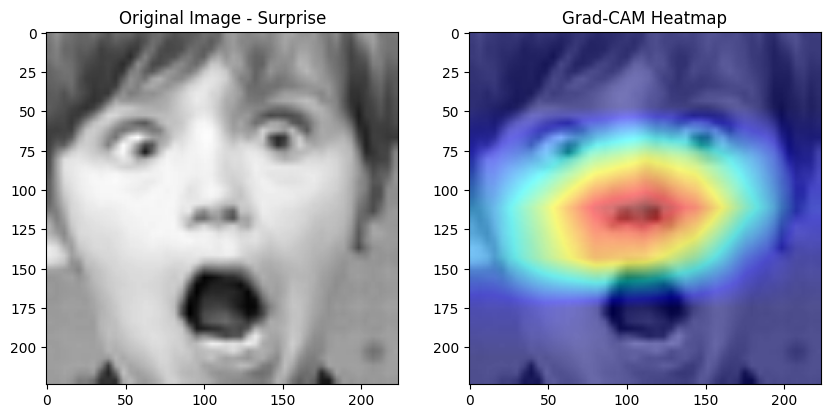

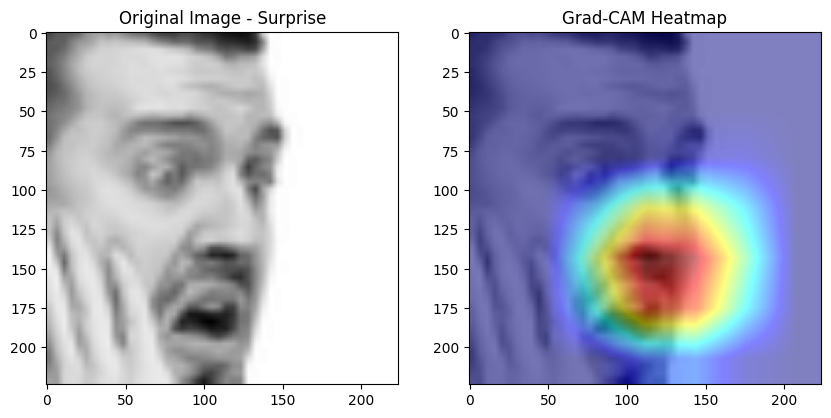

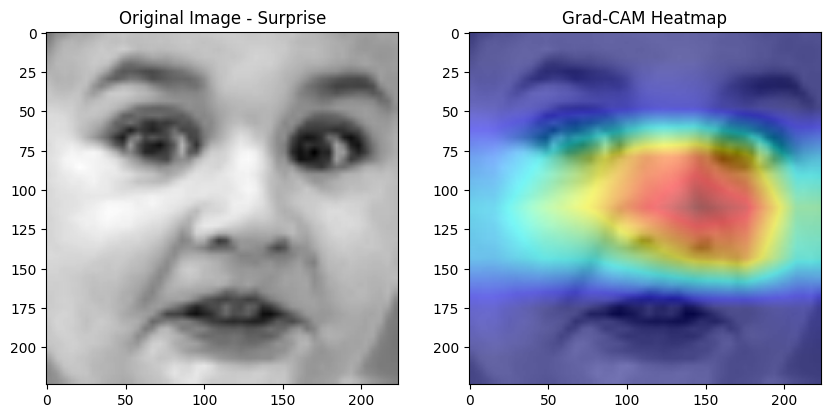

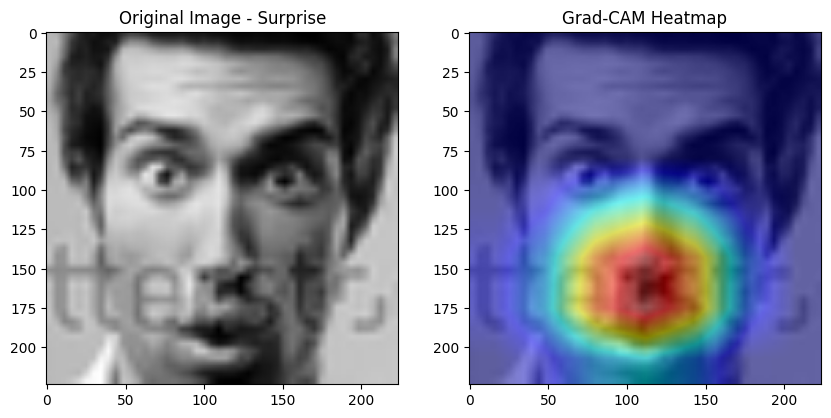

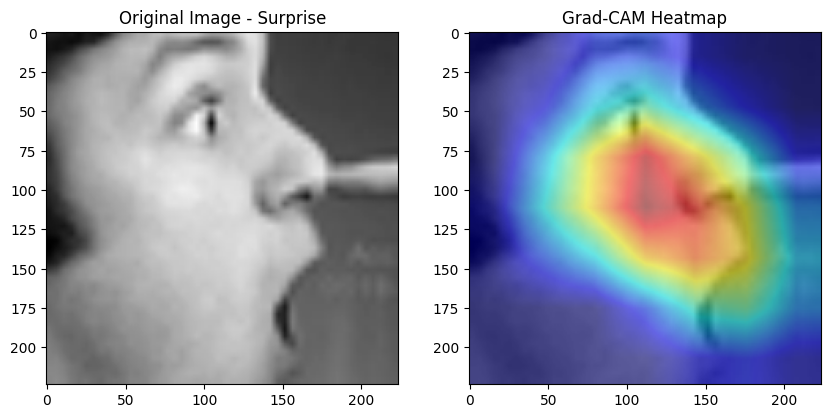

...

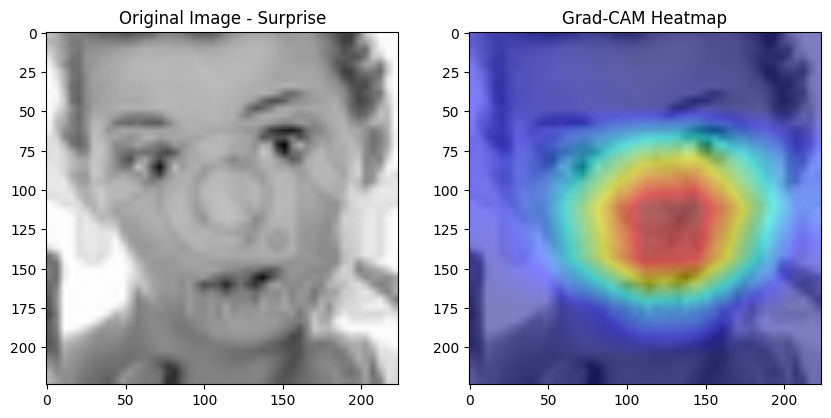

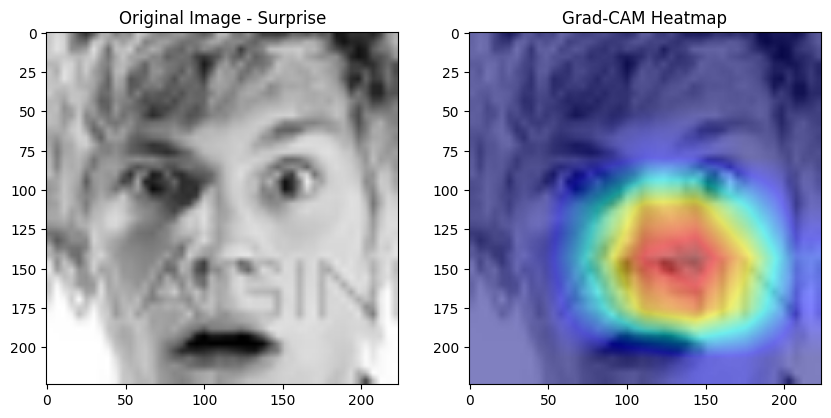

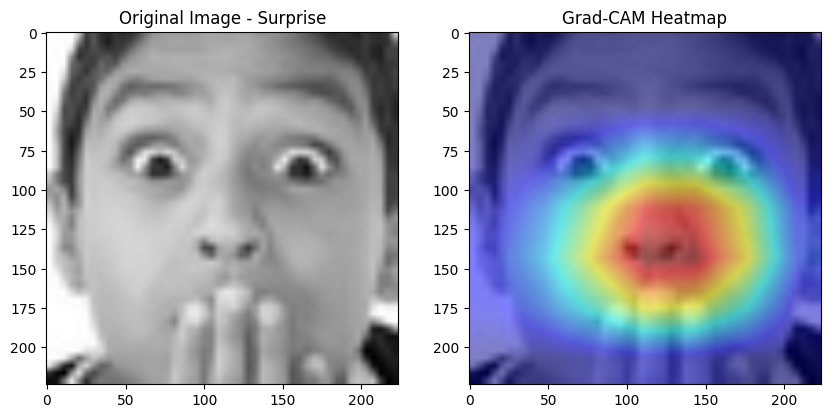

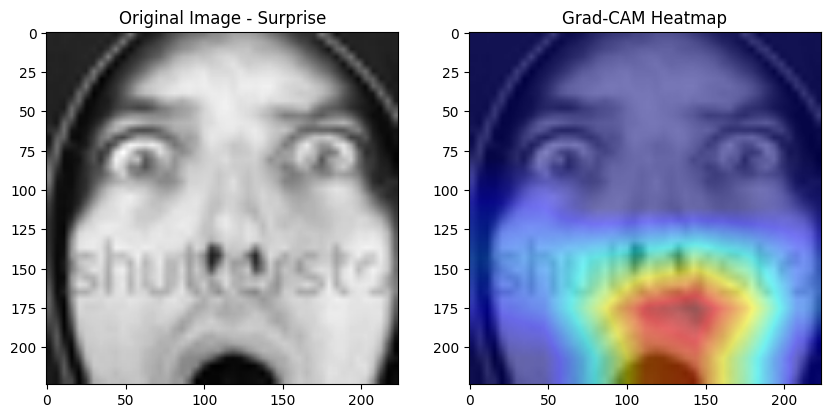

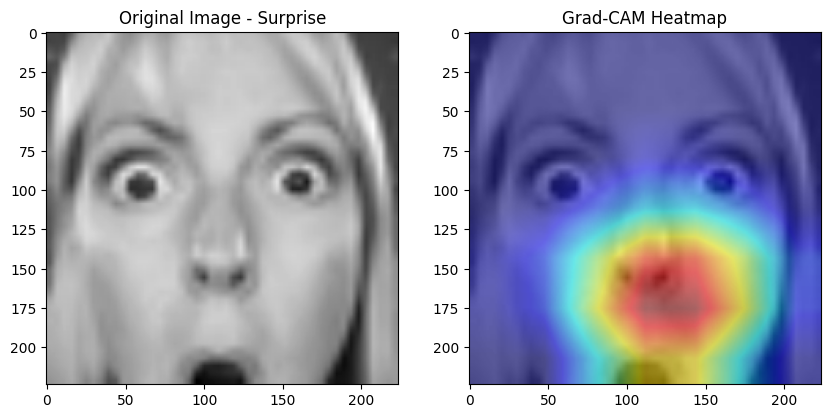

In [59]:
# Apply Grad-CAM to correctly predicted "Surprise" samples
for idx, (image, label) in enumerate(correct_class_samples):
    cam = grad_cam(model, image, class_index, target_layer)

    # Prepare the image for visualization
    input_image = image.squeeze().permute(1, 2, 0).detach().cpu().numpy()
    input_image = (input_image - input_image.min()) / (input_image.max() - input_image.min())  # Normalize to [0, 1]
    input_image = np.uint8(255 * input_image)

    # Overlay the Grad-CAM heatmap
    overlay = overlay_heatmap(input_image, cam)

    # Plot the results
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(input_image)
    plt.title("Original Image - Surprise")

    plt.subplot(1, 2, 2)
    plt.imshow(overlay)
    plt.title("Grad-CAM Heatmap")
    plt.show()

    # Stop after visualizing a few examples
    if idx >= 10:
        break

# Class Label = Neutral

In [60]:
class_index = list(emotion_labels.keys())[list(emotion_labels.values()).index('Neutral')]

In [61]:
correct_class_samples = find_correct_test_labels(model, test_dataloader, class_index)
print(len(correct_class_samples))

Testing...:   0%|          | 0/3589 [00:00<?, ?it/s]

<ipython-input-9-1cc328b73519>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image = torch.tensor(image, dtype=torch.float32)


460


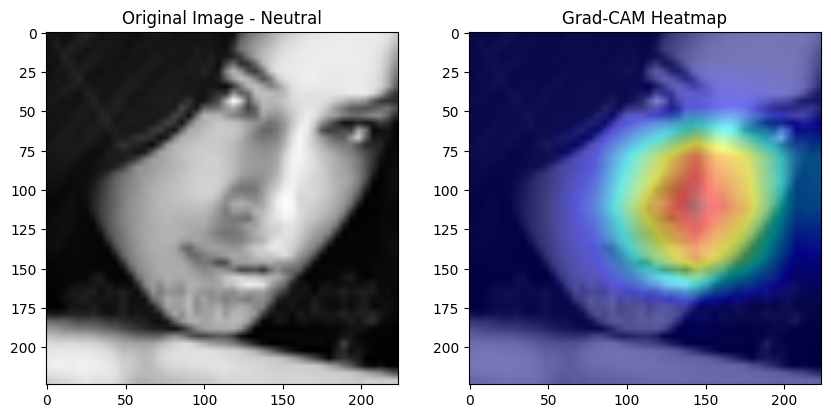

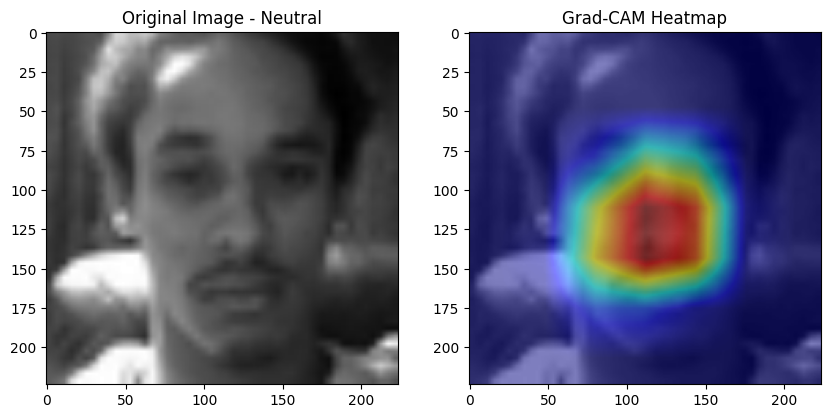

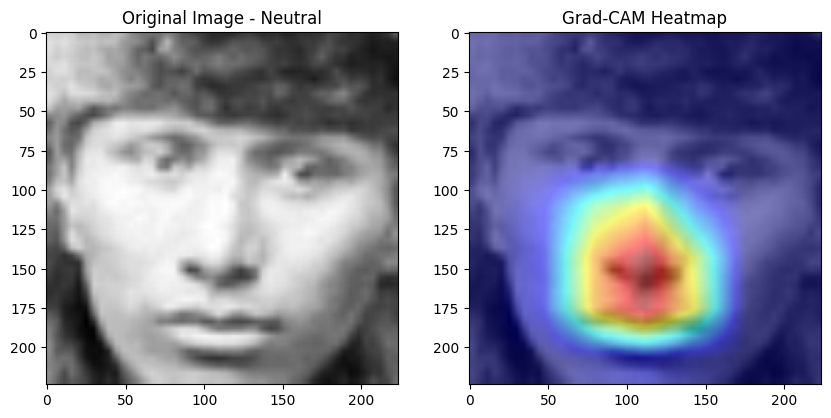

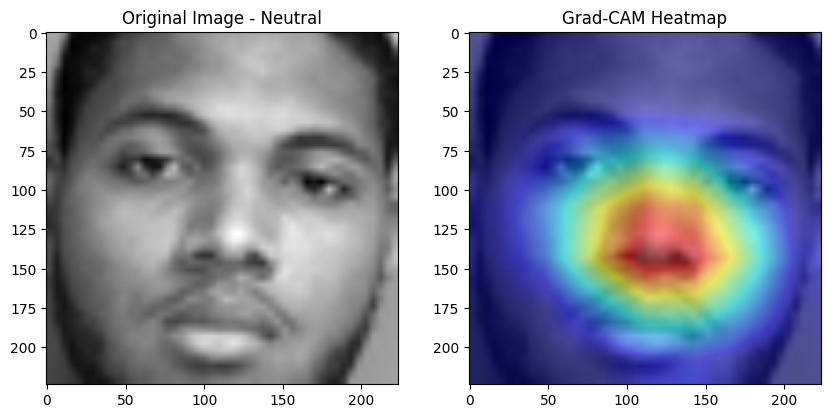

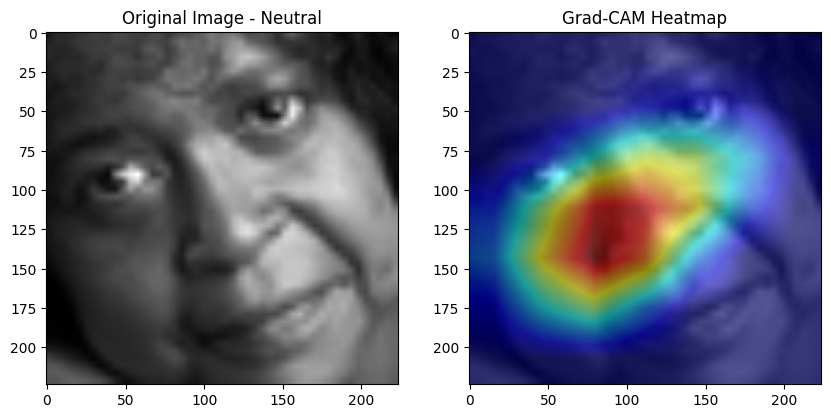

...

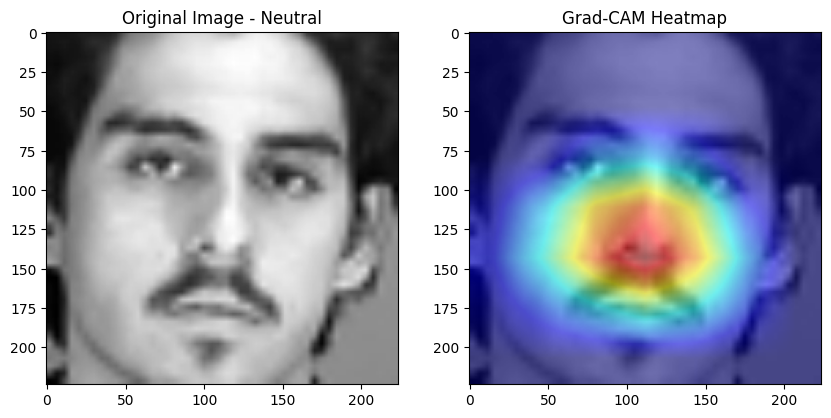

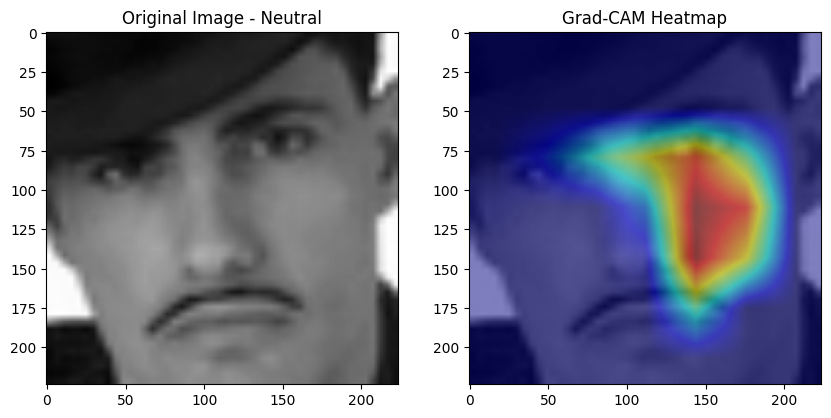

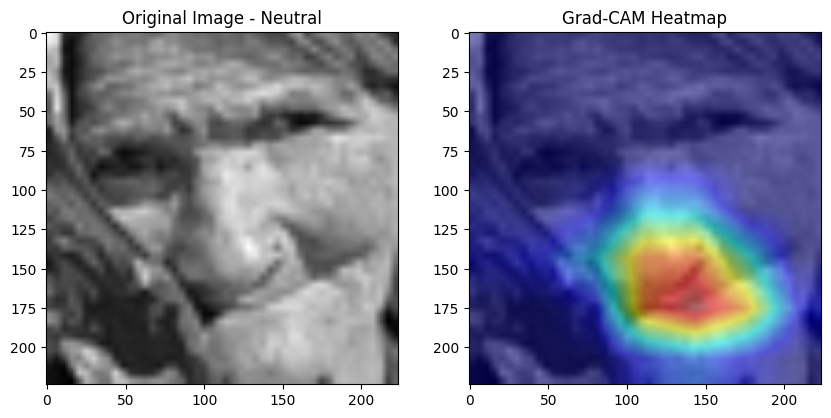

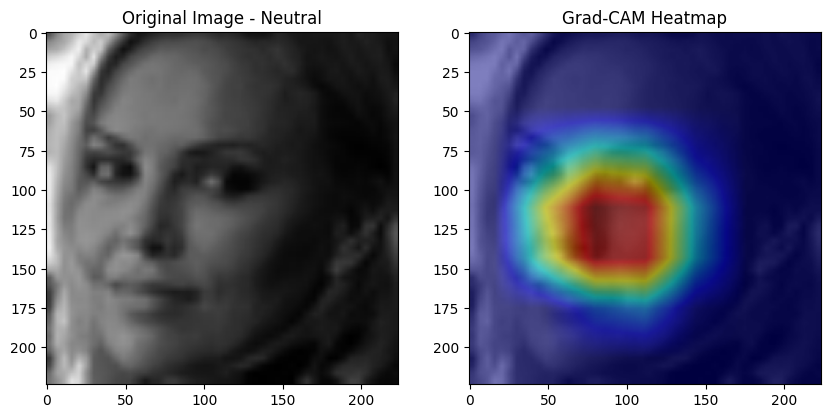

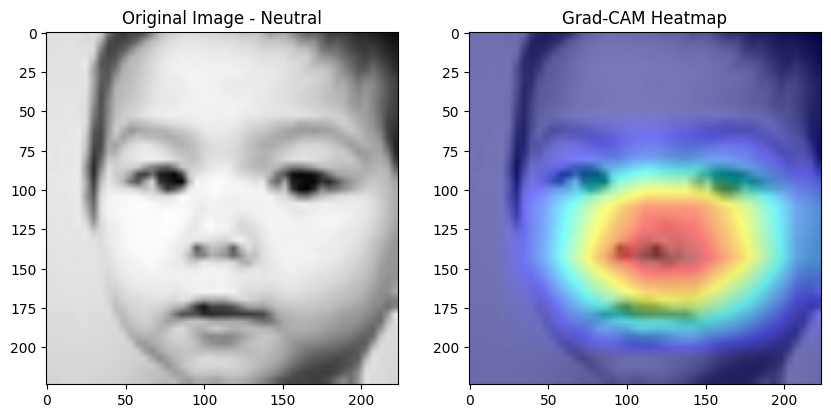

In [62]:
# Apply Grad-CAM to correctly predicted "Neutral" samples
for idx, (image, label) in enumerate(correct_class_samples):
    cam = grad_cam(model, image, class_index, target_layer)

    # Prepare the image for visualization
    input_image = image.squeeze().permute(1, 2, 0).detach().cpu().numpy()
    input_image = (input_image - input_image.min()) / (input_image.max() - input_image.min())  # Normalize to [0, 1]
    input_image = np.uint8(255 * input_image)

    # Overlay the Grad-CAM heatmap
    overlay = overlay_heatmap(input_image, cam)

    # Plot the results
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(input_image)
    plt.title("Original Image - Neutral")

    plt.subplot(1, 2, 2)
    plt.imshow(overlay)
    plt.title("Grad-CAM Heatmap")
    plt.show()

    # Stop after visualizing a few examples
    if idx >= 10:
        break

# Class Label = Angry

In [63]:
class_index = list(emotion_labels.keys())[list(emotion_labels.values()).index('Angry')]

In [64]:
correct_class_samples = find_correct_test_labels(model, test_dataloader, class_index)
print(len(correct_class_samples))

Testing...:   0%|          | 0/3589 [00:00<?, ?it/s]

<ipython-input-9-1cc328b73519>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image = torch.tensor(image, dtype=torch.float32)


340


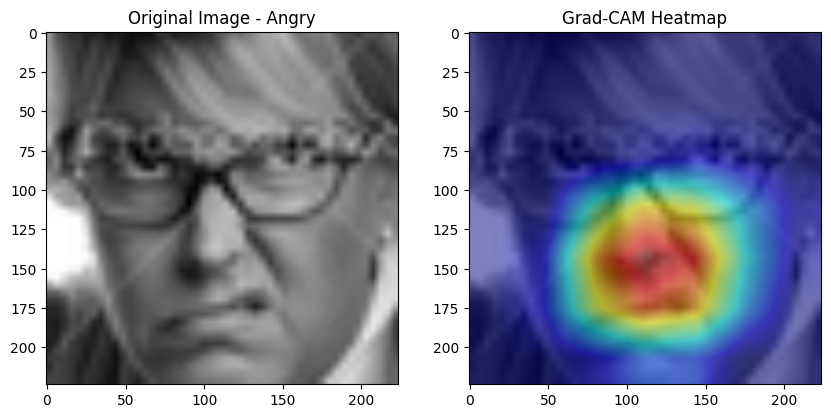

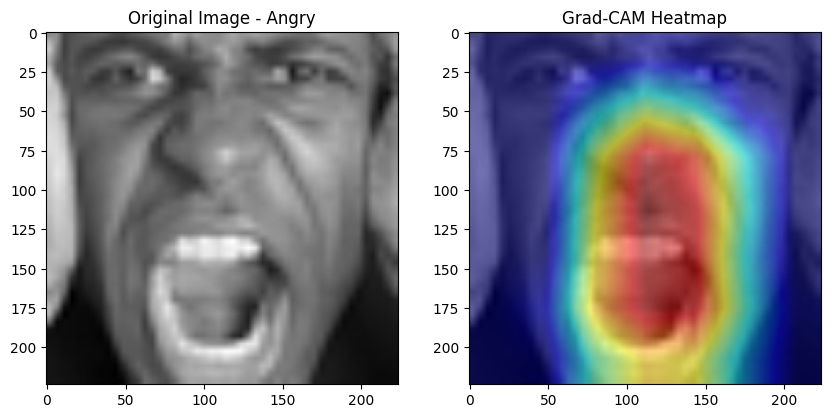

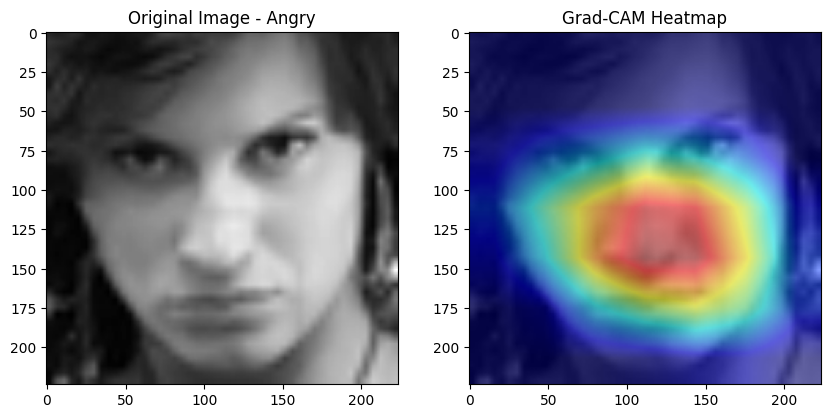

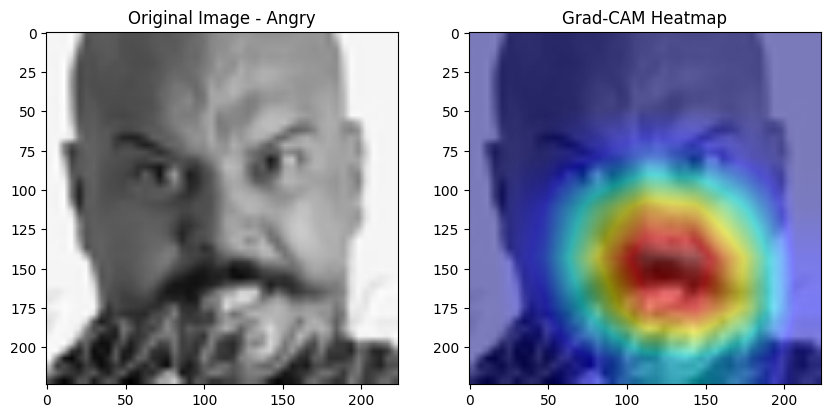

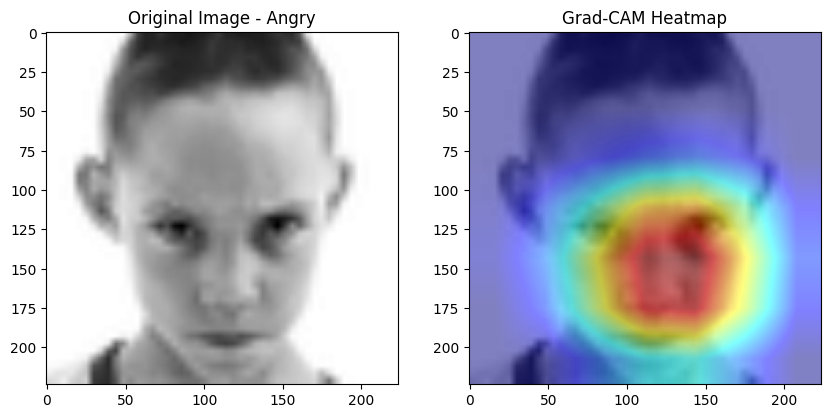

...

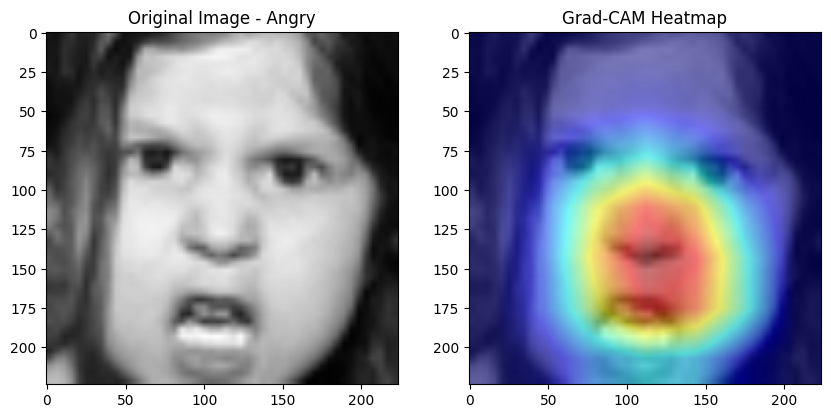

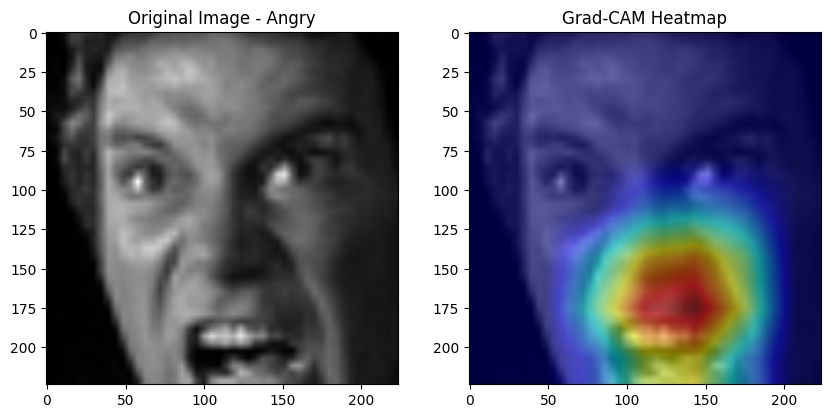

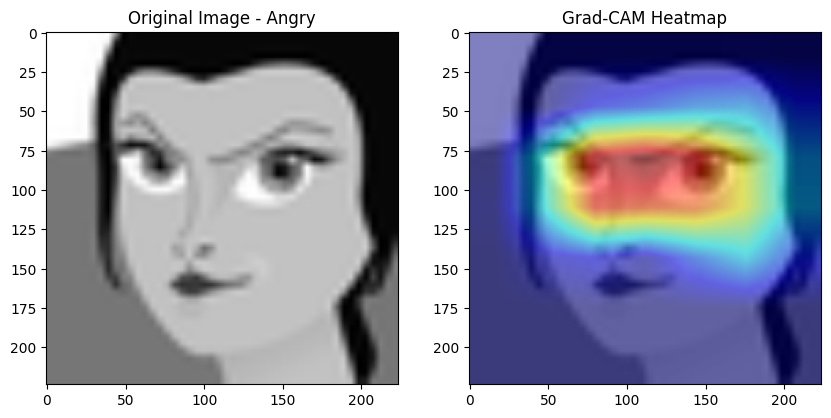

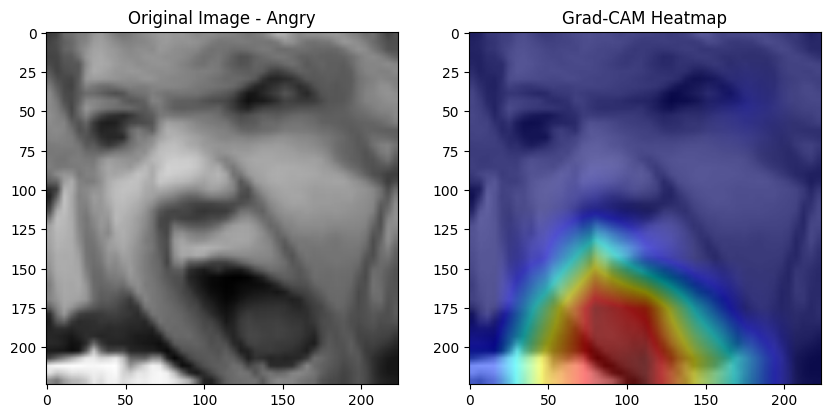

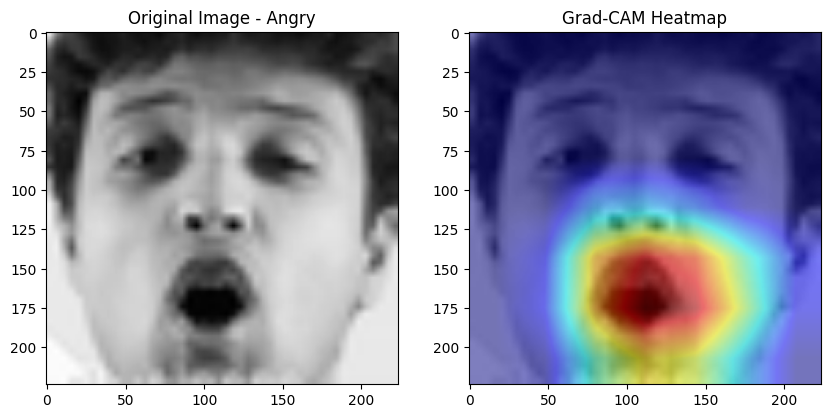

In [65]:
# Apply Grad-CAM to correctly predicted "Angry" samples
for idx, (image, label) in enumerate(correct_class_samples):
    cam = grad_cam(model, image, class_index, target_layer)

    # Prepare the image for visualization
    input_image = image.squeeze().permute(1, 2, 0).detach().cpu().numpy()
    input_image = (input_image - input_image.min()) / (input_image.max() - input_image.min())  # Normalize to [0, 1]
    input_image = np.uint8(255 * input_image)

    # Overlay the Grad-CAM heatmap
    overlay = overlay_heatmap(input_image, cam)

    # Plot the results
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(input_image)
    plt.title("Original Image - Angry")

    plt.subplot(1, 2, 2)
    plt.imshow(overlay)
    plt.title("Grad-CAM Heatmap")
    plt.show()

    # Stop after visualizing a few examples
    if idx >= 10:
        break

# Class Label = Disgust

In [66]:
class_index = list(emotion_labels.keys())[list(emotion_labels.values()).index('Disgust')]

In [67]:
correct_class_samples = find_correct_test_labels(model, test_dataloader, class_index)
print(len(correct_class_samples))

Testing...:   0%|          | 0/3589 [00:00<?, ?it/s]

<ipython-input-9-1cc328b73519>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image = torch.tensor(image, dtype=torch.float32)


34


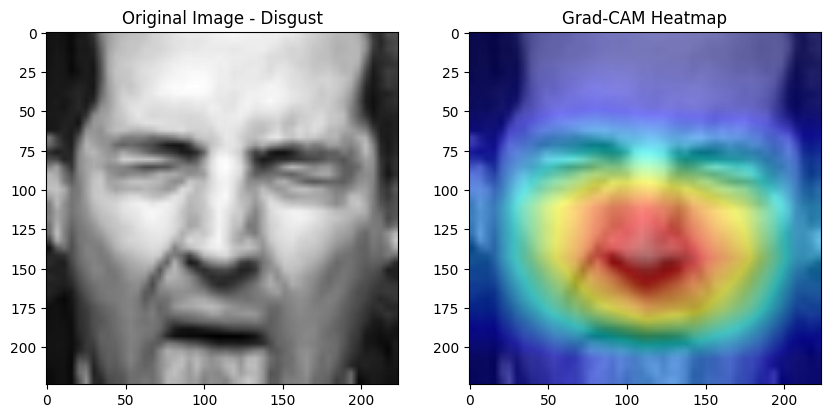

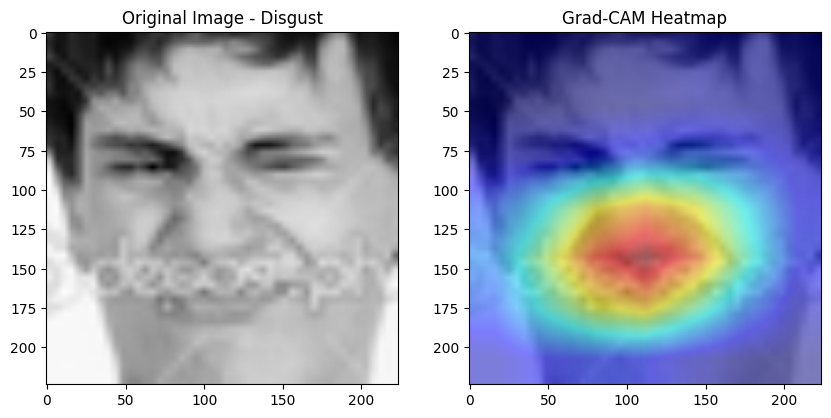

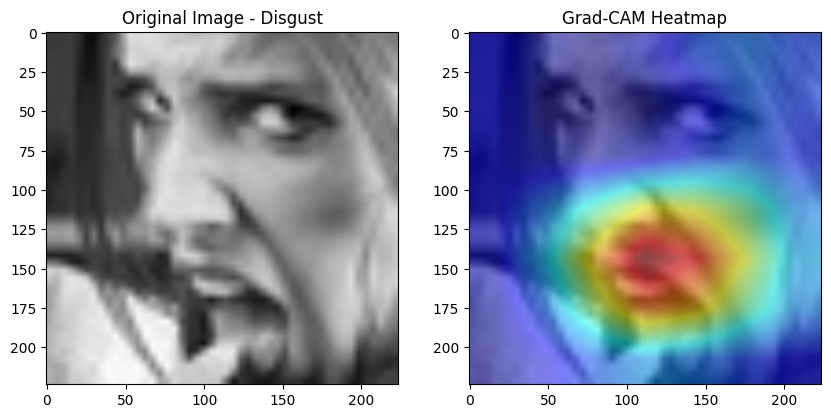

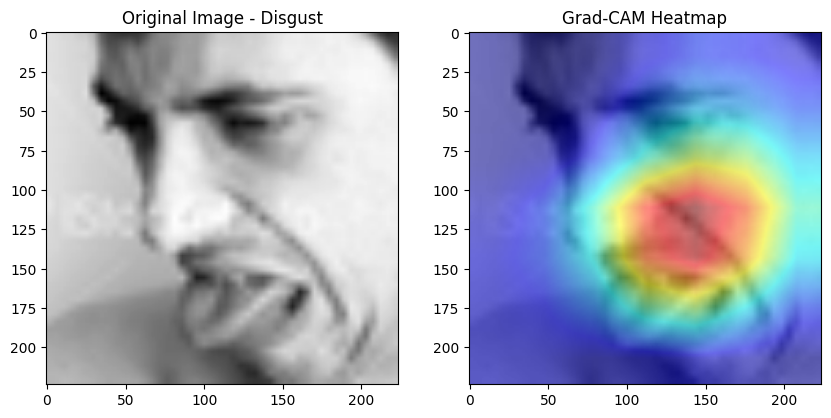

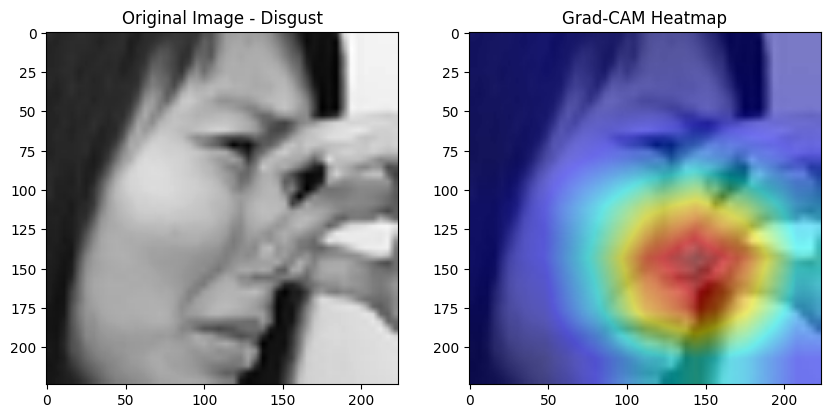

...

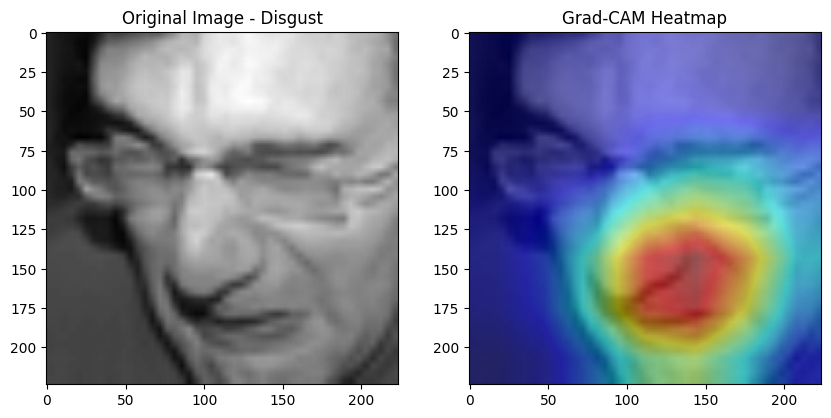

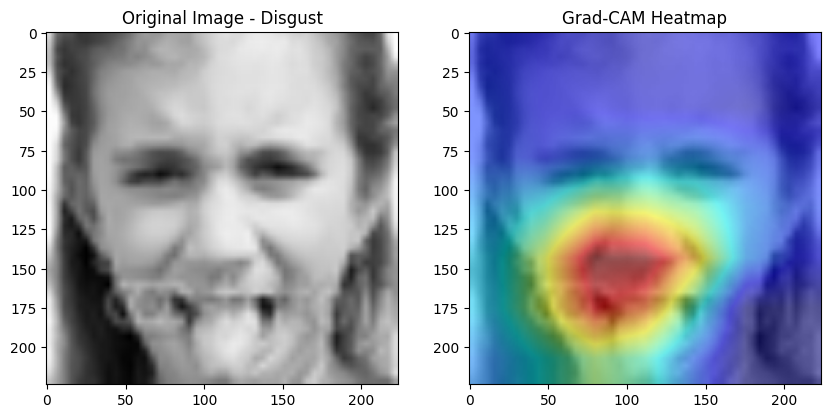

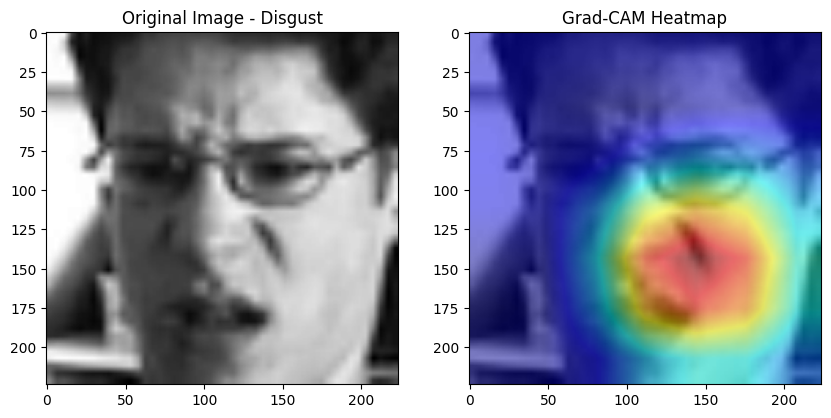

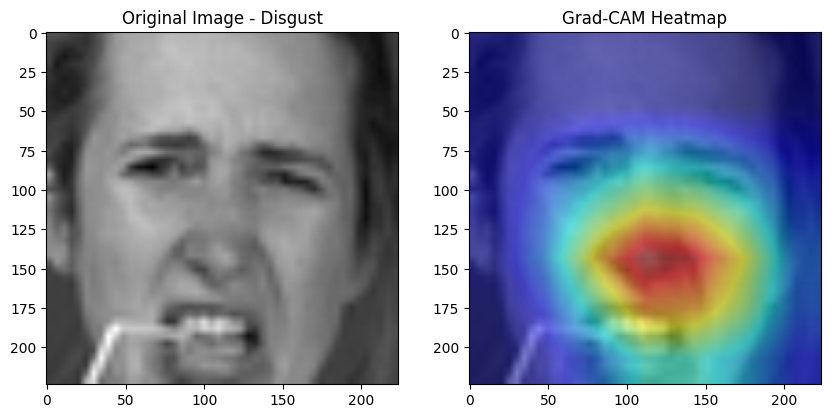

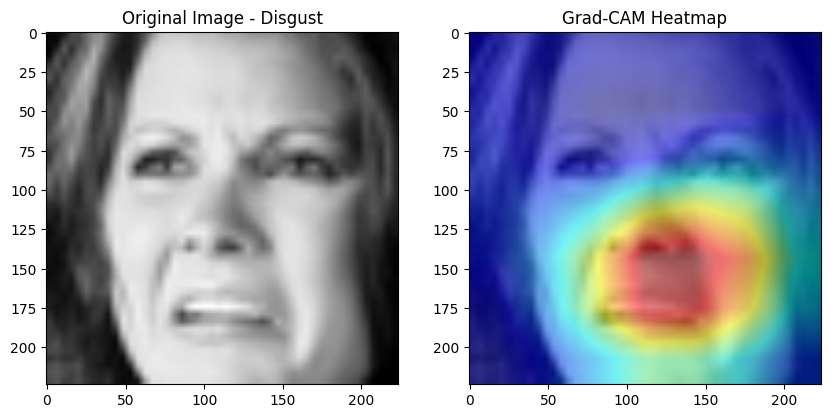

In [68]:
# Apply Grad-CAM to correctly predicted "Disgust" samples
for idx, (image, label) in enumerate(correct_class_samples):
    cam = grad_cam(model, image, class_index, target_layer)

    # Prepare the image for visualization
    input_image = image.squeeze().permute(1, 2, 0).detach().cpu().numpy()
    input_image = (input_image - input_image.min()) / (input_image.max() - input_image.min())  # Normalize to [0, 1]
    input_image = np.uint8(255 * input_image)

    # Overlay the Grad-CAM heatmap
    overlay = overlay_heatmap(input_image, cam)

    # Plot the results
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(input_image)
    plt.title("Original Image - Disgust")

    plt.subplot(1, 2, 2)
    plt.imshow(overlay)
    plt.title("Grad-CAM Heatmap")
    plt.show()

    # Stop after visualizing a few examples
    if idx >= 10:
        break

# Class Label = Fear

In [69]:
class_index = list(emotion_labels.keys())[list(emotion_labels.values()).index('Fear')]

In [70]:
correct_class_samples = find_correct_test_labels(model, test_dataloader, class_index)
print(len(correct_class_samples))

Testing...:   0%|          | 0/3589 [00:00<?, ?it/s]

<ipython-input-9-1cc328b73519>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image = torch.tensor(image, dtype=torch.float32)


212


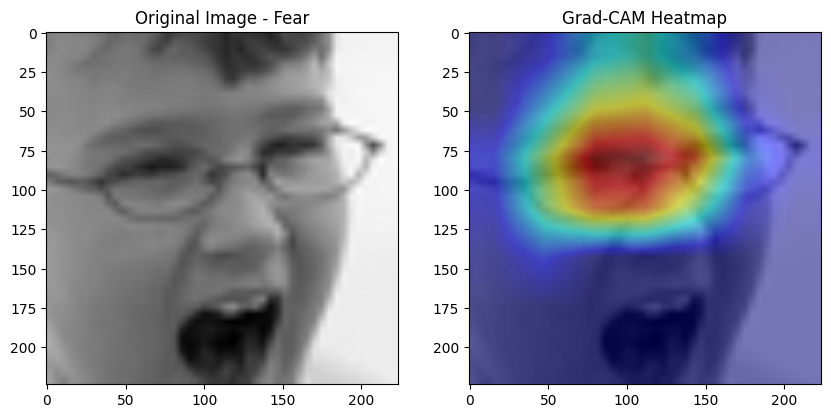

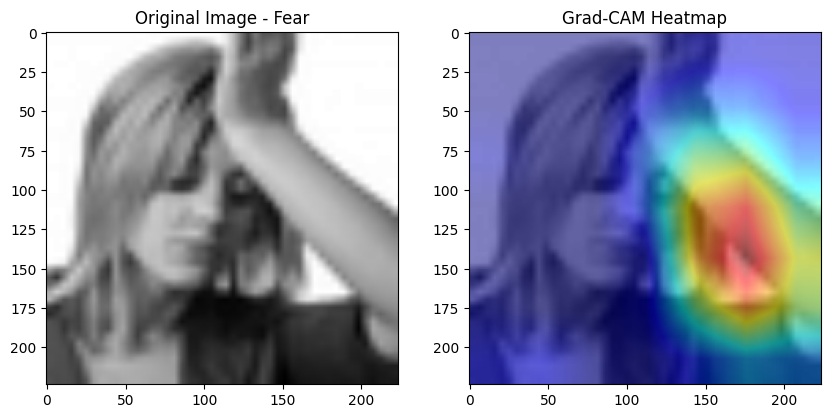

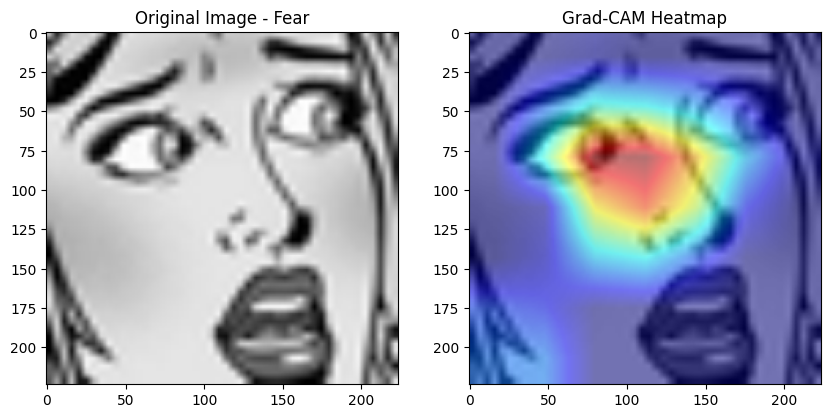

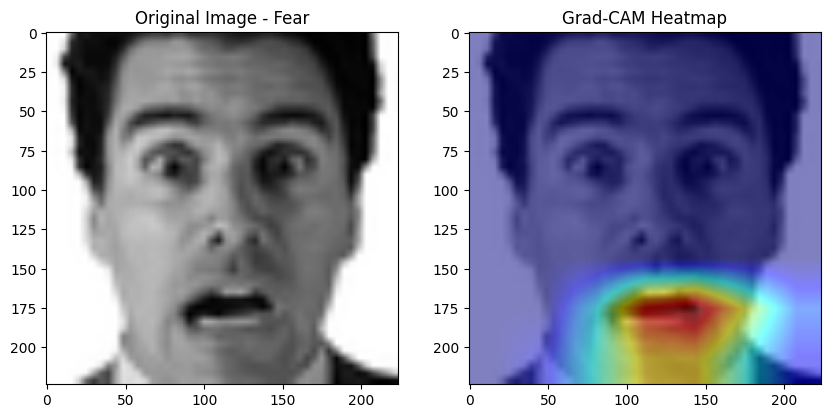

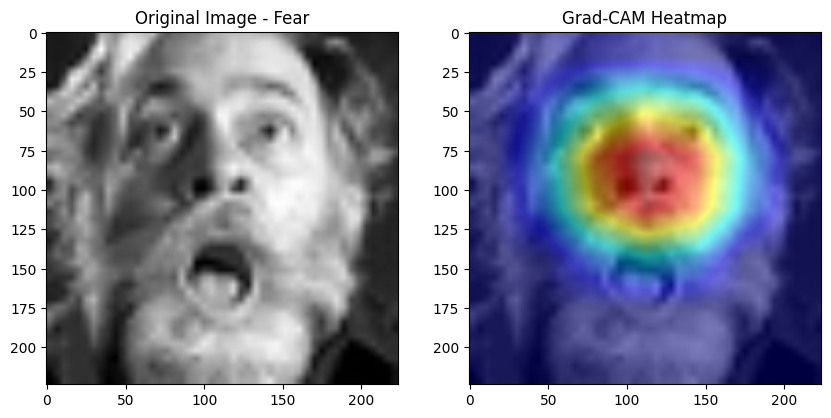

...

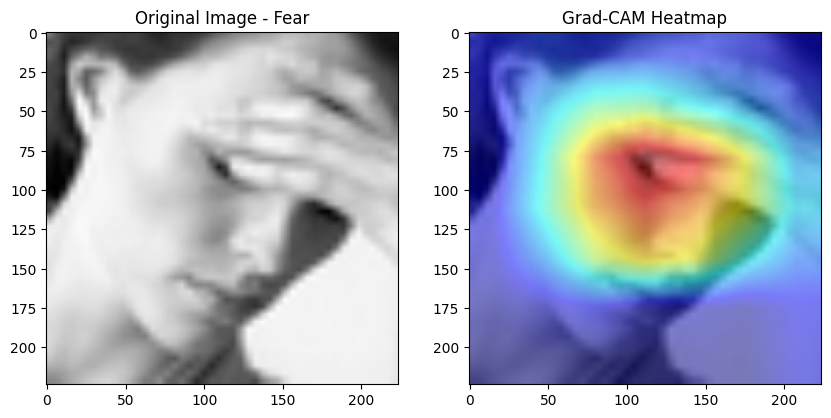

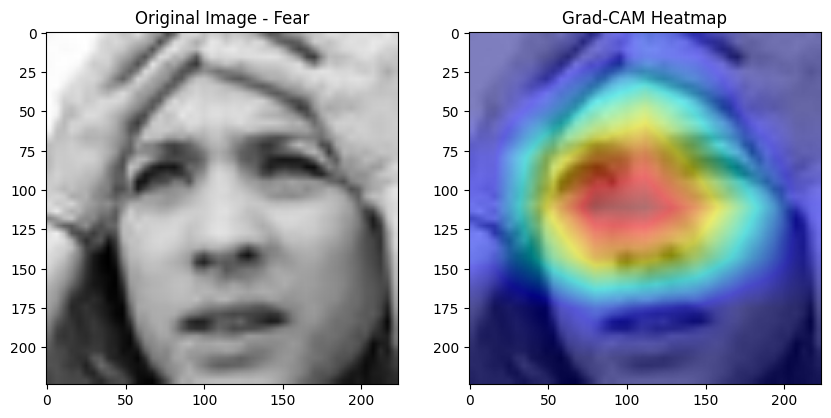

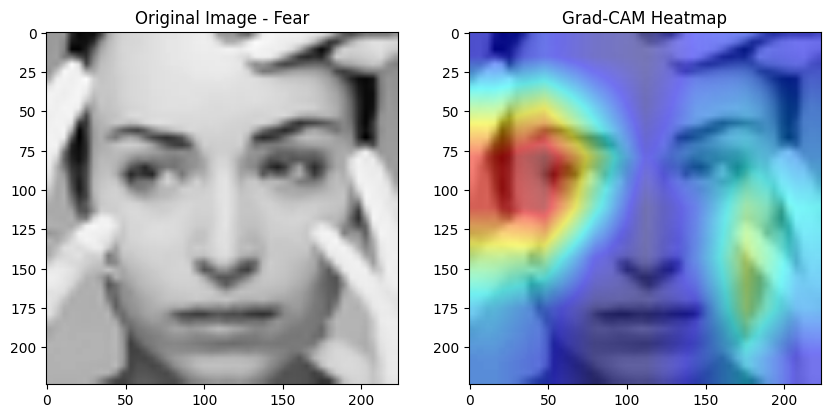

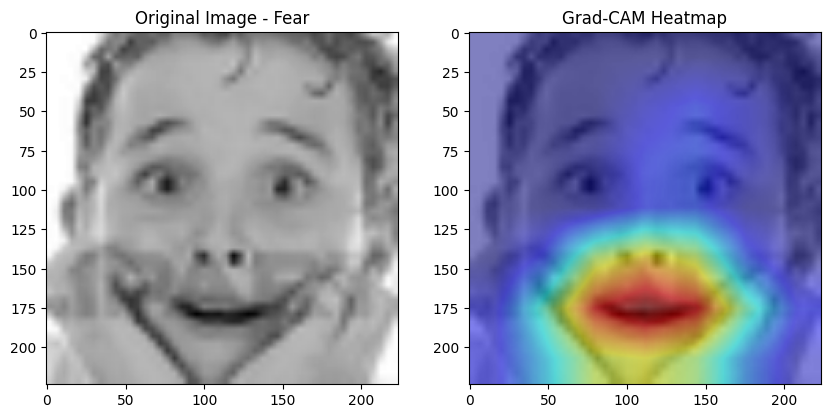

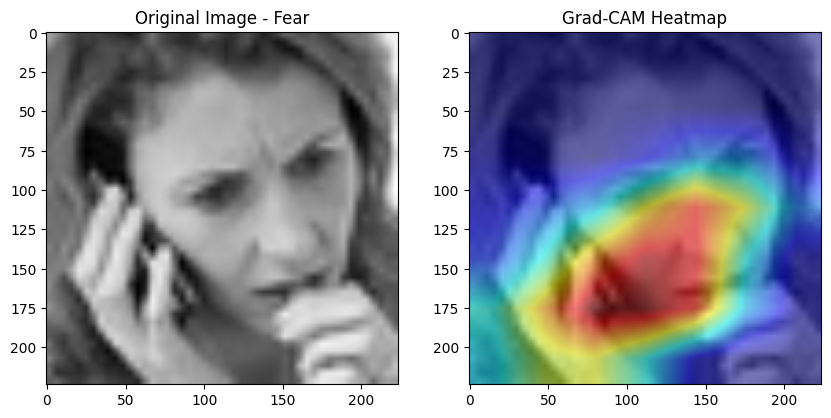

In [71]:
# Apply Grad-CAM to correctly predicted "Fear" samples
for idx, (image, label) in enumerate(correct_class_samples):
    cam = grad_cam(model, image, class_index, target_layer)

    # Prepare the image for visualization
    input_image = image.squeeze().permute(1, 2, 0).detach().cpu().numpy()
    input_image = (input_image - input_image.min()) / (input_image.max() - input_image.min())  # Normalize to [0, 1]
    input_image = np.uint8(255 * input_image)

    # Overlay the Grad-CAM heatmap
    overlay = overlay_heatmap(input_image, cam)

    # Plot the results
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(input_image)
    plt.title("Original Image - Fear")

    plt.subplot(1, 2, 2)
    plt.imshow(overlay)
    plt.title("Grad-CAM Heatmap")
    plt.show()

    # Stop after visualizing a few examples
    if idx >= 10:
        break

# Class Label = Sad

In [72]:
class_index = list(emotion_labels.keys())[list(emotion_labels.values()).index('Sad')]

In [73]:
correct_class_samples = find_correct_test_labels(model, test_dataloader, class_index)
print(len(correct_class_samples))

Testing...:   0%|          | 0/3589 [00:00<?, ?it/s]

<ipython-input-9-1cc328b73519>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image = torch.tensor(image, dtype=torch.float32)


305


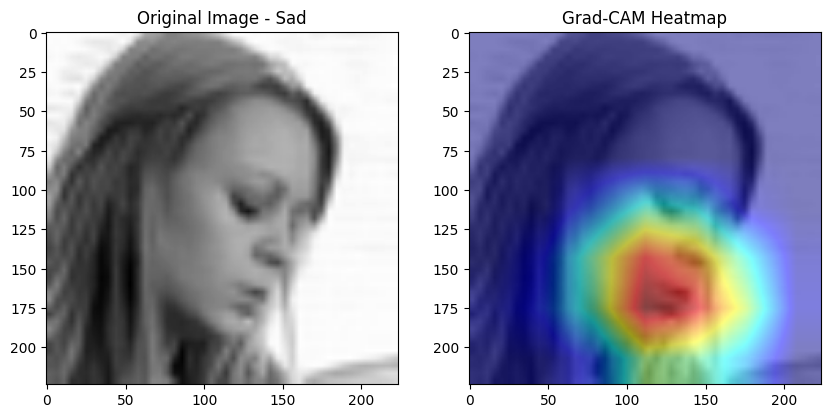

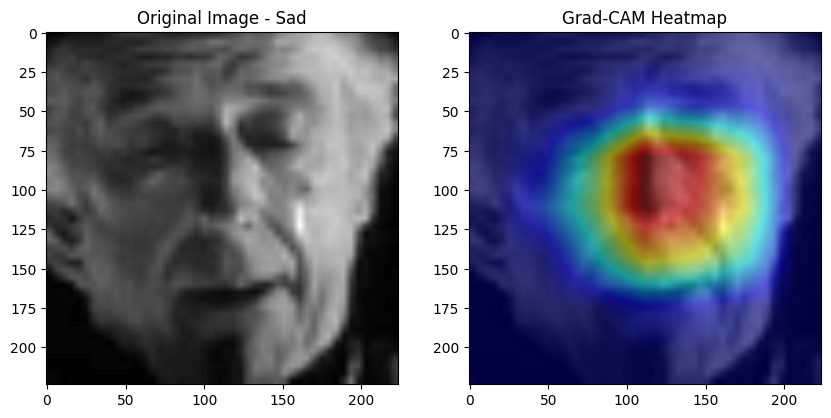

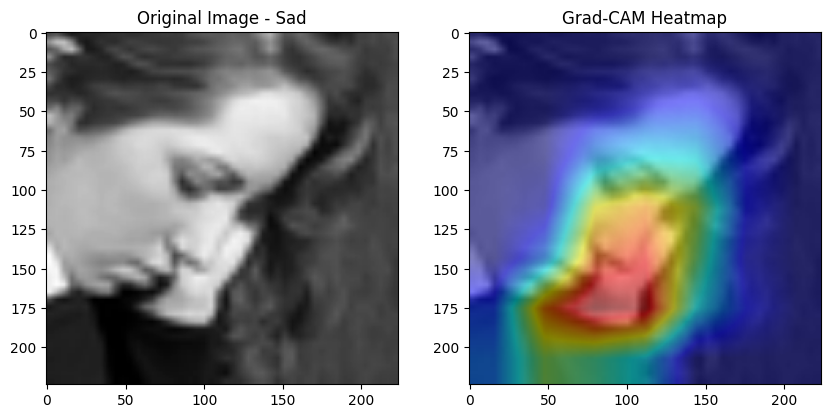

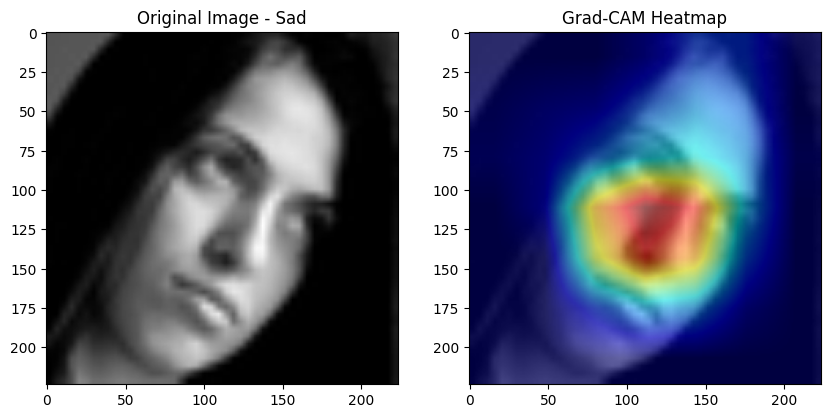

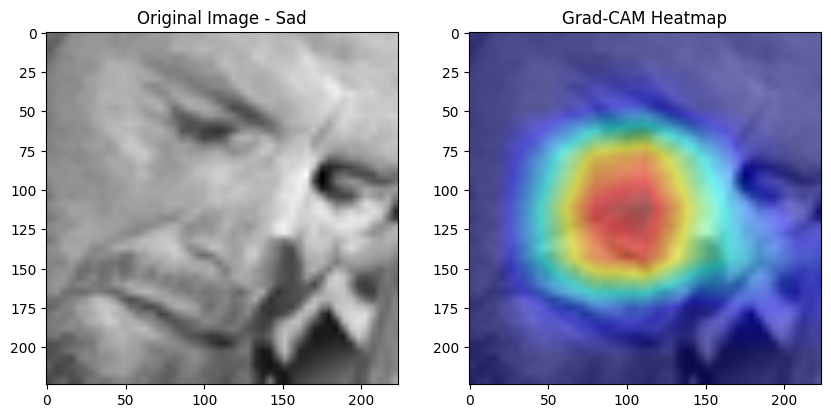

...

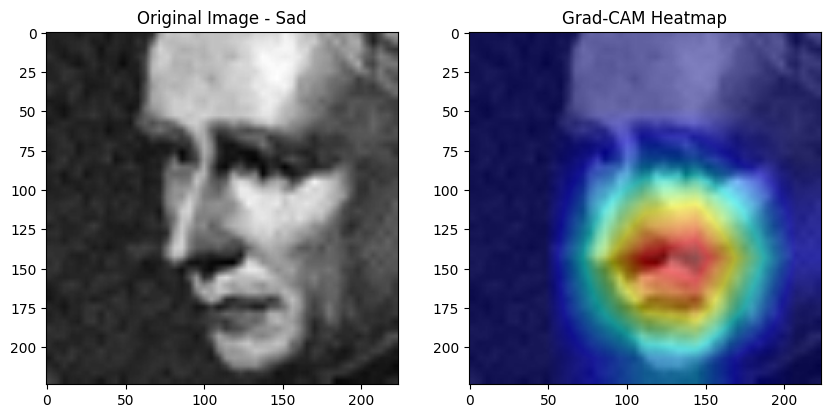

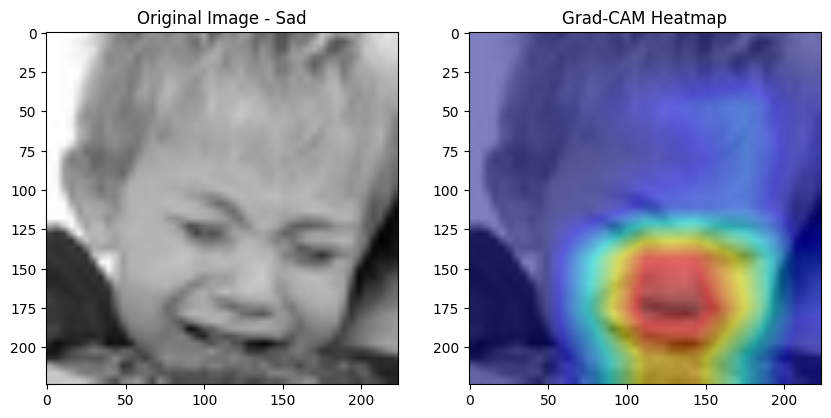

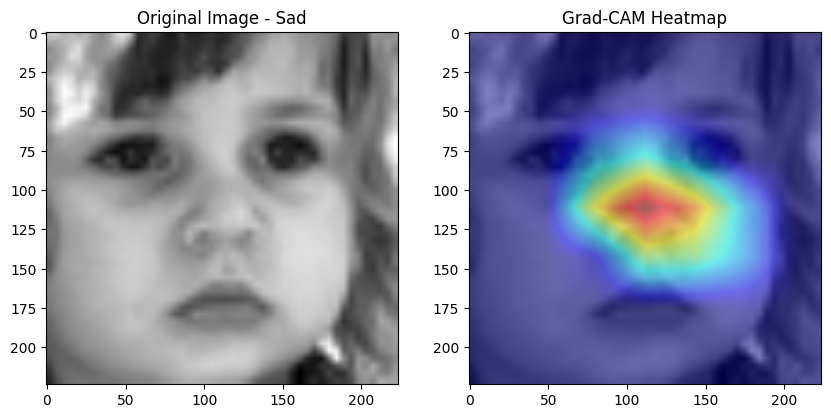

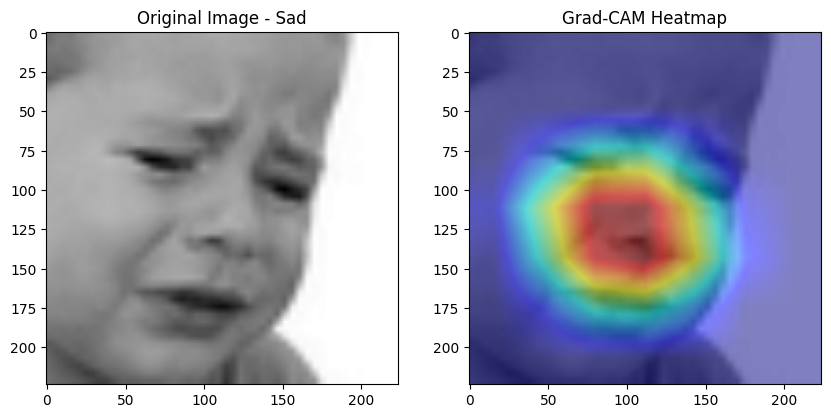

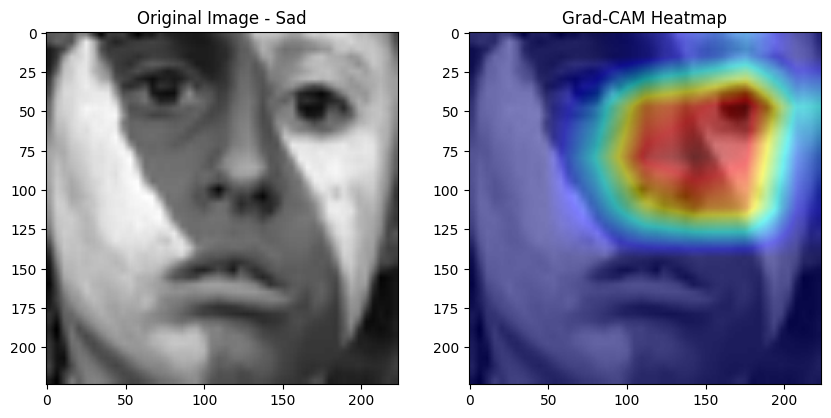

In [74]:
# Apply Grad-CAM to correctly predicted "Sad" samples
for idx, (image, label) in enumerate(correct_class_samples):
    cam = grad_cam(model, image, class_index, target_layer)

    # Prepare the image for visualization
    input_image = image.squeeze().permute(1, 2, 0).detach().cpu().numpy()
    input_image = (input_image - input_image.min()) / (input_image.max() - input_image.min())  # Normalize to [0, 1]
    input_image = np.uint8(255 * input_image)

    # Overlay the Grad-CAM heatmap
    overlay = overlay_heatmap(input_image, cam)

    # Plot the results
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(input_image)
    plt.title("Original Image - Sad")

    plt.subplot(1, 2, 2)
    plt.imshow(overlay)
    plt.title("Grad-CAM Heatmap")
    plt.show()

    # Stop after visualizing a few examples
    if idx >= 10:
        break